In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.express as px
import plotly.io as pio
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
%matplotlib inline

In [ ]:
import kaggle

In [2]:
!kaggle datasets download yakinrubaiat/bangladesh-weather-dataset -f Temp_and_rain.csv
!kaggle datasets download yakinrubaiat/bangladesh-weather-dataset -f sorted_temp_and_rain_dataset.csv

Dataset URL: https://www.kaggle.com/datasets/yakinrubaiat/bangladesh-weather-dataset
License(s): Attribution 4.0 International (CC BY 4.0)




  0%|          | 0.00/32.4k [00:00<?, ?B/s]
100%|##########| 32.4k/32.4k [00:00<00:00, 95.0kB/s]
100%|##########| 32.4k/32.4k [00:00<00:00, 93.8kB/s]


Dataset URL: https://www.kaggle.com/datasets/yakinrubaiat/bangladesh-weather-dataset


  0%|          | 0.00/35.3k [00:00<?, ?B/s]
100%|##########| 35.3k/35.3k [00:00<00:00, 143kB/s]
100%|##########| 35.3k/35.3k [00:00<00:00, 141kB/s]



License(s): Attribution 4.0 International (CC BY 4.0)



## If there zip file extract file from zip file
import zipfile
zip_ref = zipfile.ZipFile('orders.csv.zip') 
zip_ref.extractall() # extract file to dir
zip_ref.close() # close file

In [4]:
#read data from the file and handle null values
import pandas as pd
df_tr = pd.read_csv('Temp_and_rain.csv',na_values=['Not Available','unknown'])
df_tr.head(5)


,tem,Month,Year,rain
0,16.9760,1,1901,18.5356
1,19.9026,2,1901,16.2548
2,24.3158,3,1901,70.7981
3,28.1834,4,1901,66.1616
4,27.8892,5,1901,267.2150


In [5]:
df_str = pd.read_csv('sorted_temp_and_rain_dataset.csv',na_values=['Not Available','unknown'])
df_str.head(5)

,tem,Month,Year,rain
0,16.9760,1,1901,18.5356
1,19.9026,2,1901,16.2548
2,24.3158,3,1901,70.7981
3,28.1834,4,1901,66.1616
4,27.8892,5,1901,267.2150


<Axes: xlabel='Year', ylabel='rain'>

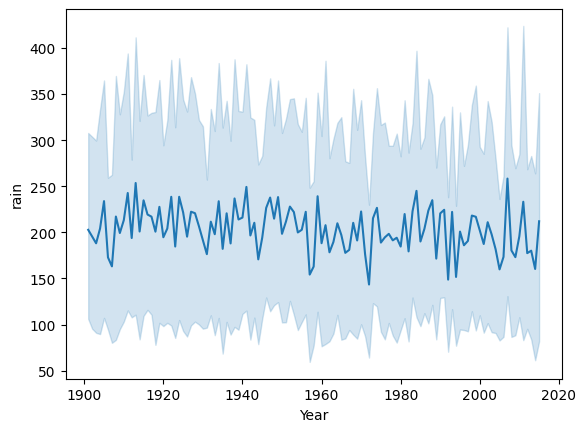

In [6]:
import seaborn as sns
sns.lineplot(x='Year',y='rain',data=df_tr)

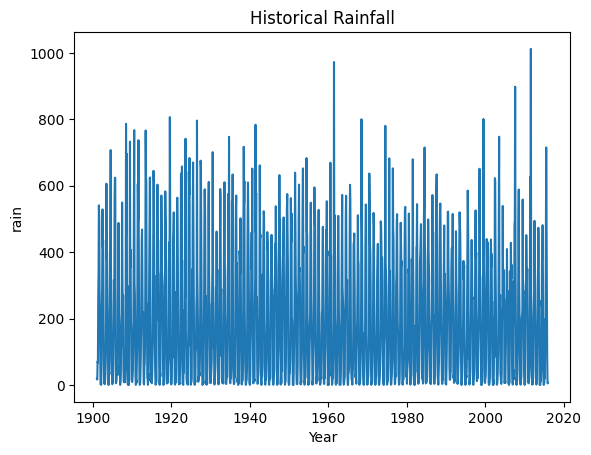

C:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Python312\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


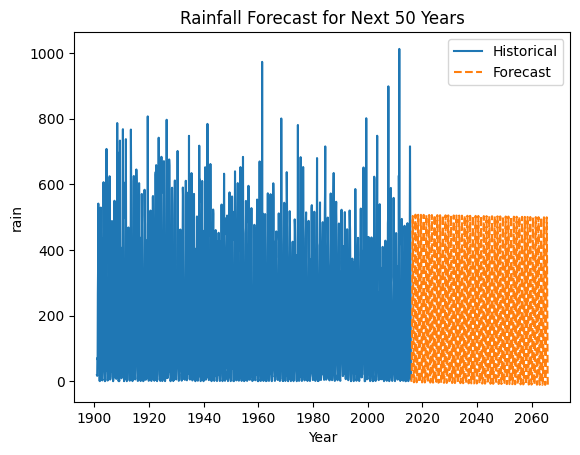

In [7]:

from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert to DataFrame
df = pd.DataFrame(df_tr)

# Create a datetime index
df['Date'] = pd.to_datetime(df['Year'].astype(str) + '-' + df['Month'].astype(str))
df.set_index('Date', inplace=True)
df = df.drop(['Year', 'Month'], axis=1)

# Plot the data
plt.plot(df['rain'])
plt.title('Historical Rainfall')
plt.xlabel('Year')
plt.ylabel('rain')
plt.show()

# Define the SARIMA model
model = SARIMAX(df['rain'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
model_fit = model.fit(disp=False)

# Forecast for the next 50 years (600 months)
forecast = model_fit.forecast(steps=600)

# Plot the forecast
plt.plot(df['rain'], label='Historical')
plt.plot(forecast, label='Forecast', linestyle='--')
plt.title('Rainfall Forecast for Next 50 Years')
plt.xlabel('Year')
plt.ylabel('rain')
plt.legend()
plt.show()


<Axes: xlabel='Year', ylabel='tem'>

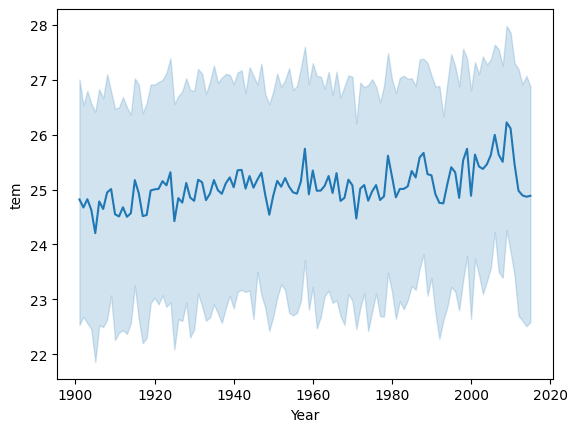

In [6]:
import seaborn as sns
sns.lineplot(x='Year',y='tem',data=df_tr)

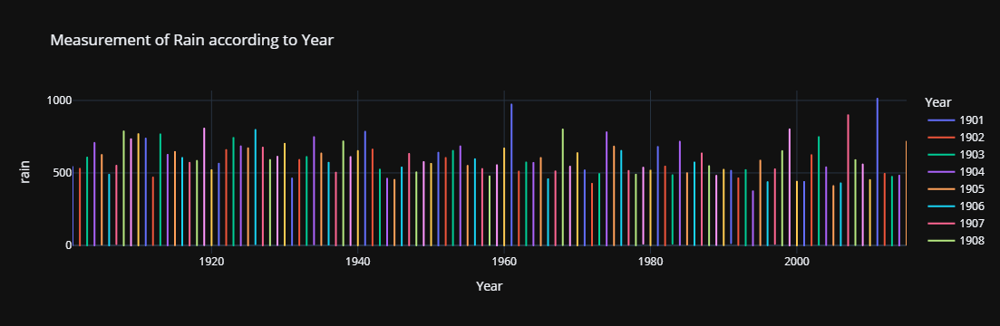

In [8]:
pio.templates.default = "plotly_dark"
fig = px.line(df_tr,x='Year',y='rain',color="Year",title="Measurement of Rain according to Year")
fig.show()

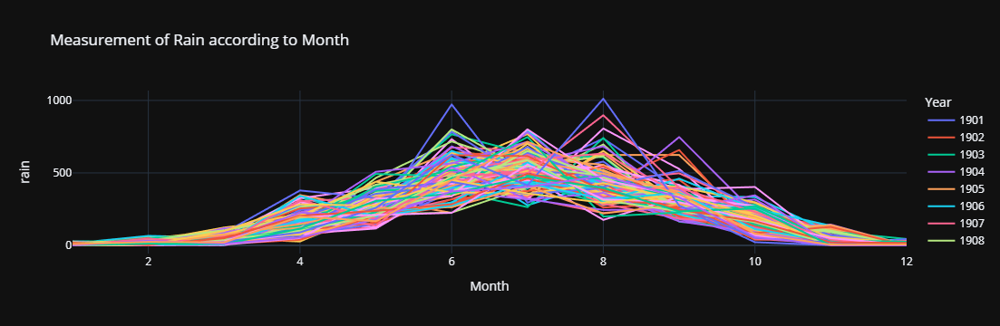

In [10]:
pio.templates.default = "plotly_dark"
fig = px.line(df_tr,x='Month',y='rain',color="Year",title="Measurement of Rain according to Month")
fig.show()

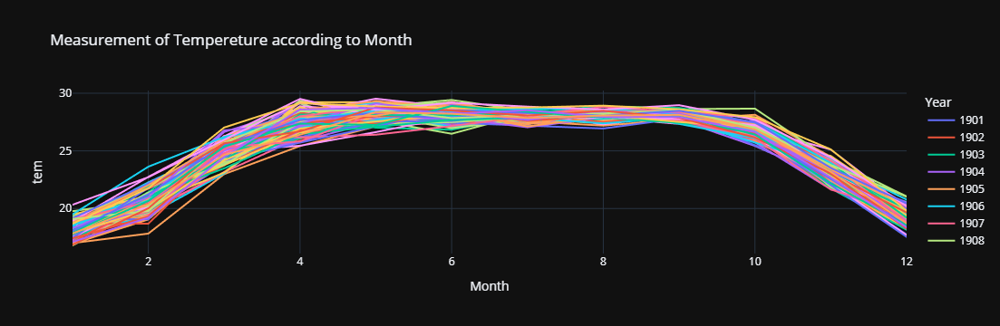

In [7]:
pio.templates.default = "plotly_dark"
fig = px.line(df_tr,x='Month',y='tem',color="Year",title="Measurement of Tempereture according to Month")
fig.show()

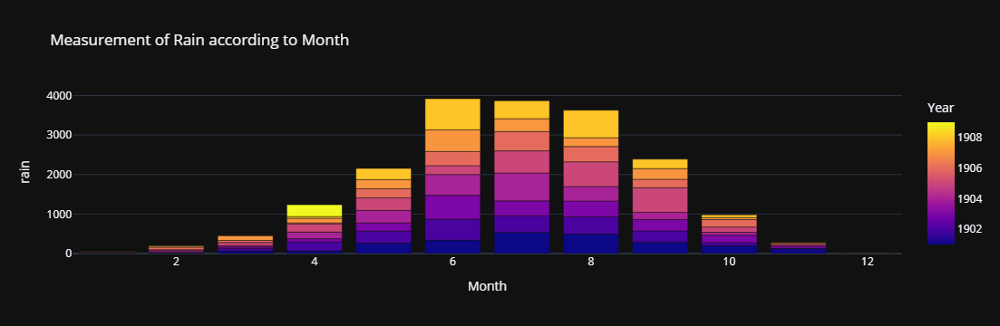

In [11]:
pio.templates.default = "plotly_dark"
fig = px.bar(df_tr[0:100],x='Month',y='rain',color="Year",title="Measurement of Rain according to Month")
fig.show()

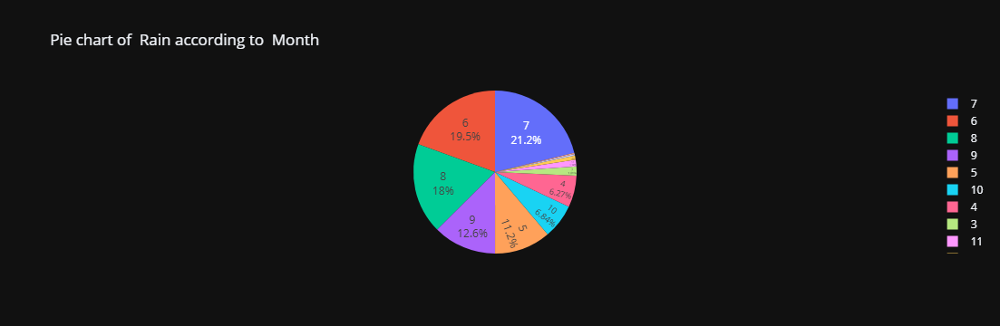

In [12]:
fig = px.pie(data_frame=df_tr,values="rain",names='Month',labels= {"Month"},
             title="Pie chart of  Rain according to  Month")
fig.update_traces(textposition ='inside',textinfo='percent+label')
fig.show()

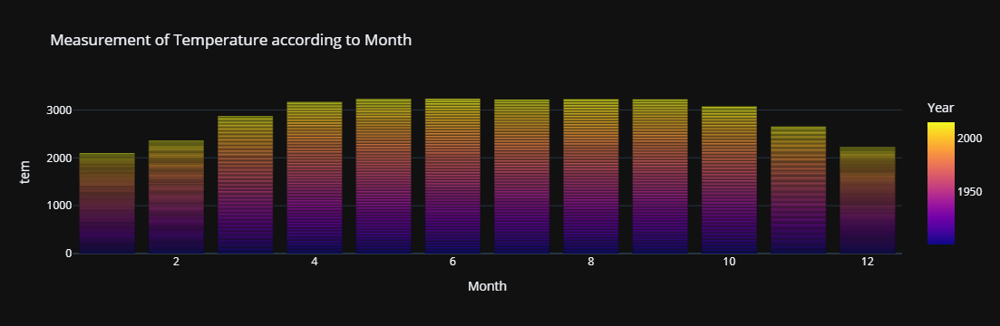

In [13]:
pio.templates.default = "plotly_dark"
fig = px.bar(df_tr,x='Month',y='tem',color="Year",title="Measurement of Temperature according to Month")
fig.show()

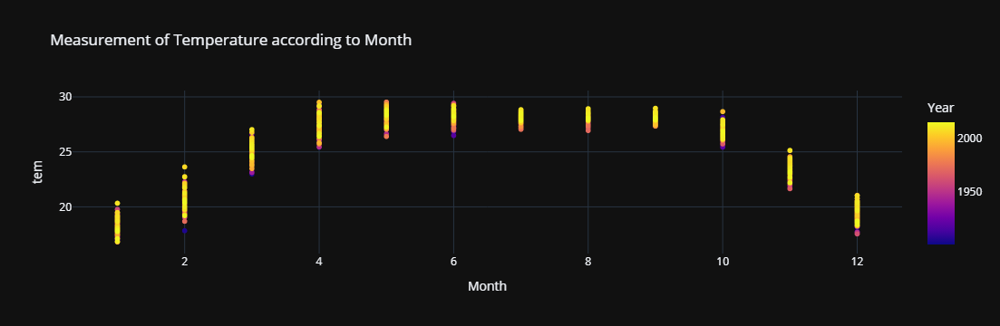

In [14]:
pio.templates.default = "plotly_dark"
fig = px.scatter(df_tr,x='Month',y='tem',color="Year",title="Measurement of Temperature according to Month")
fig.show()

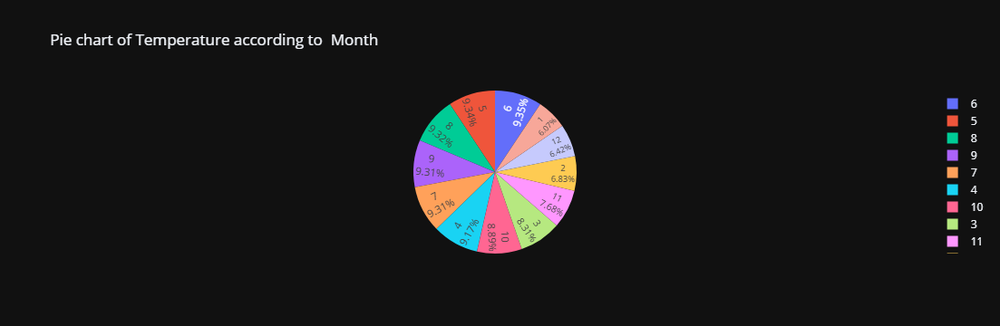

In [15]:
fig = px.pie(data_frame=df_tr,values="tem",names='Month',labels= {"Month"},
             title="Pie chart of Temperature according to  Month")
fig.update_traces(textposition ='inside',textinfo='percent+label')
fig.show()

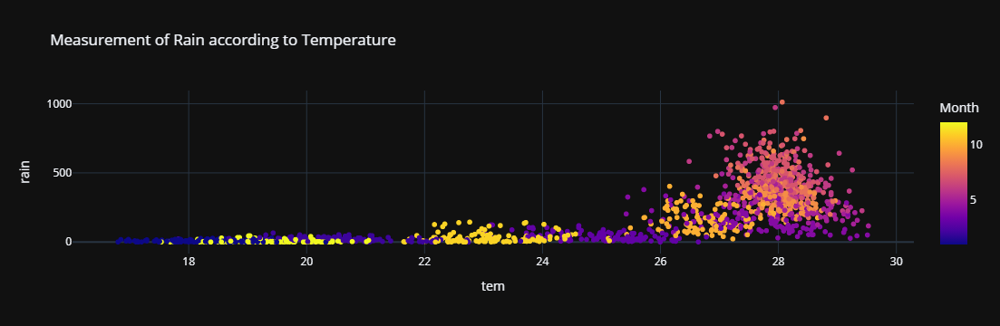

In [16]:
pio.templates.default = "plotly_dark"
fig = px.scatter(df_tr,x='tem',y ='rain',color="Month",title="Measurement of Rain according to Temperature")
fig.show()

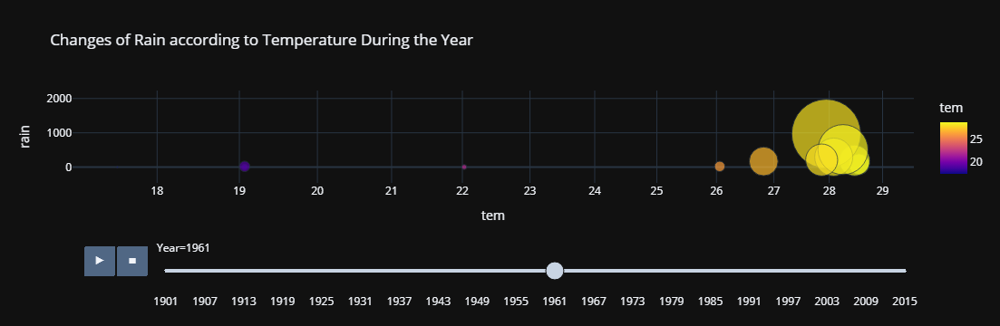

In [17]:
pio.templates.default = "plotly_dark"
fig = px.scatter(df_tr,x='tem',y ='rain',animation_frame ='Year',animation_group = 'Month',
                 title="Changes of Rain according to Temperature During the Year",size="rain",color="tem",
                 hover_name="Month",log_x = True,size_max = 55)
fig.show()

In [7]:
df_tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1380 entries, 0 to 1379
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tem     1380 non-null   float64
 1   Month   1380 non-null   int64  
 2   Year    1380 non-null   int64  
 3   rain    1380 non-null   float64
dtypes: float64(2), int64(2)
memory usage: 43.3 KB


In [8]:
df_tr.describe()

,tem,Month,Year,rain
count,1380.000000,1380.000000,1380.00000,1380.000000
mean,25.066213,6.500000,1958.00000,203.275431
std,3.682411,3.453304,33.20842,202.730898
min,16.800600,1.000000,1901.00000,0.000000
25%,22.114125,3.750000,1929.00000,18.498850
50%,27.012950,6.500000,1958.00000,145.086000
75%,28.007850,9.250000,1987.00000,347.639500
max,29.526000,12.000000,2015.00000,1012.020000


In [39]:
mapping = {12 : "Winter",1:"Winter",2:"Spring",3:"Spring",10:"Late autumn",
           11:"Late autumn",8:"Autumn",9:"Autumn",6:"Rainy",7:"Rainy",4:"Summer",5:"Summer"}
df_tr["Season"] = df_tr["Month"].map(mapping).astype(str)

In [40]:
df_tr['rain_temp_ratio'] = df_tr['rain'] / df_tr['tem']
print(df_tr)

      Year  Month      tem       rain  rain_temp_ratio temp_category  \
0     1901      1  16.9760   18.53560         1.091871           Low   
1     1901      2  19.9026   16.25480         0.816717           Low   
2     1901      3  24.3158   70.79810         2.911609        Medium   
3     1901      4  28.1834   66.16160         2.347538          High   
4     1901      5  27.8892  267.21500         9.581307          High   
...    ...    ...      ...        ...              ...           ...   
1375  2015      8  28.0642  512.12700        18.248409          High   
1376  2015      9  28.1230  353.86900        12.582904          High   
1377  2015     10  26.8624   81.59940         3.037681          High   
1378  2015     11  23.1842    4.60815         0.198763        Medium   
1379  2015     12  18.7124    5.97798         0.319466           Low   

     rain_category       Season  
0              Low       Winter  
1              Low       Spring  
2              Low       Spring  

In [41]:
def categorize_temp(temp):
    if temp < 20:
        return 'Low'
    elif 20 <= temp < 25:
        return 'Medium'
    else:
        return 'High'

df_tr['temp_category'] = df_tr['tem'].apply(categorize_temp)
print(df_tr)

      Year  Month      tem       rain  rain_temp_ratio temp_category  \
0     1901      1  16.9760   18.53560         1.091871           Low   
1     1901      2  19.9026   16.25480         0.816717           Low   
2     1901      3  24.3158   70.79810         2.911609        Medium   
3     1901      4  28.1834   66.16160         2.347538          High   
4     1901      5  27.8892  267.21500         9.581307          High   
...    ...    ...      ...        ...              ...           ...   
1375  2015      8  28.0642  512.12700        18.248409          High   
1376  2015      9  28.1230  353.86900        12.582904          High   
1377  2015     10  26.8624   81.59940         3.037681          High   
1378  2015     11  23.1842    4.60815         0.198763        Medium   
1379  2015     12  18.7124    5.97798         0.319466           Low   

     rain_category       Season  
0              Low       Winter  
1              Low       Spring  
2              Low       Spring  

In [42]:
def categorize_rain(rain):
    if rain < 400:
        return 'Low'
    elif 20 <= rain < 800:
        return 'Medium'
    else:
        return 'High'

df_tr['rain_category'] = df_tr['rain'].apply(categorize_rain)
print(df_tr)

      Year  Month      tem       rain  rain_temp_ratio temp_category  \
0     1901      1  16.9760   18.53560         1.091871           Low   
1     1901      2  19.9026   16.25480         0.816717           Low   
2     1901      3  24.3158   70.79810         2.911609        Medium   
3     1901      4  28.1834   66.16160         2.347538          High   
4     1901      5  27.8892  267.21500         9.581307          High   
...    ...    ...      ...        ...              ...           ...   
1375  2015      8  28.0642  512.12700        18.248409          High   
1376  2015      9  28.1230  353.86900        12.582904          High   
1377  2015     10  26.8624   81.59940         3.037681          High   
1378  2015     11  23.1842    4.60815         0.198763        Medium   
1379  2015     12  18.7124    5.97798         0.319466           Low   

     rain_category       Season  
0              Low       Winter  
1              Low       Spring  
2              Low       Spring  

In [43]:
df_tr.head(10)

,Year,Month,tem,rain,rain_temp_ratio,temp_category,rain_category,Season
0,1901,1,16.9760,18.5356,1.091871,Low,Low,Winter
1,1901,2,19.9026,16.2548,0.816717,Low,Low,Spring
2,1901,3,24.3158,70.7981,2.911609,Medium,Low,Spring
3,1901,4,28.1834,66.1616,2.347538,High,Low,Summer
4,1901,5,27.8892,267.2150,9.581307,High,Low,Summer
5,1901,6,28.8925,341.0420,11.803825,High,Low,Rainy
6,1901,7,28.3327,540.9070,19.091262,High,Medium,Rainy
7,1901,8,27.9243,493.2100,17.662394,High,Medium,Autumn
8,1901,9,27.6057,291.5490,10.561188,High,Low,Autumn
9,1901,10,27.0887,199.1710,7.352549,High,Low,Late autumn


In [44]:
# Define the new column order
new_order = ['Year', 'Month', 'tem', 'rain', 'Season', 'rain_temp_ratio',	'temp_category', 'rain_category']

# Reassign the DataFrame with the new column order
df_tr = df_tr[new_order]

print(df_tr)


      Year  Month      tem       rain       Season  rain_temp_ratio  \
0     1901      1  16.9760   18.53560       Winter         1.091871   
1     1901      2  19.9026   16.25480       Spring         0.816717   
2     1901      3  24.3158   70.79810       Spring         2.911609   
3     1901      4  28.1834   66.16160       Summer         2.347538   
4     1901      5  27.8892  267.21500       Summer         9.581307   
...    ...    ...      ...        ...          ...              ...   
1375  2015      8  28.0642  512.12700       Autumn        18.248409   
1376  2015      9  28.1230  353.86900       Autumn        12.582904   
1377  2015     10  26.8624   81.59940  Late autumn         3.037681   
1378  2015     11  23.1842    4.60815  Late autumn         0.198763   
1379  2015     12  18.7124    5.97798       Winter         0.319466   

     temp_category rain_category  
0              Low           Low  
1              Low           Low  
2           Medium           Low  
3      

In [20]:
mapping = {12 : "Winter",1:"Winter",2:"Spring",3:"Spring",10:"Late autumn",
           11:"Late autumn",8:"Autumn",9:"Autumn",6:"Rainy",7:"Rainy",4:"Summer",5:"Summer"}
df_tr["Season"] = df_tr["Month"].map(mapping).astype(str)

In [21]:
df_tr.head(12)

,tem,Month,Year,rain,Season
0,16.9760,1,1901,18.53560,Winter
1,19.9026,2,1901,16.25480,Spring
2,24.3158,3,1901,70.79810,Spring
3,28.1834,4,1901,66.16160,Summer
4,27.8892,5,1901,267.21500,Summer
5,28.8925,6,1901,341.04200,Rainy
6,28.3327,7,1901,540.90700,Rainy
7,27.9243,8,1901,493.21000,Autumn
8,27.6057,9,1901,291.54900,Autumn
9,27.0887,10,1901,199.17100,Late autumn


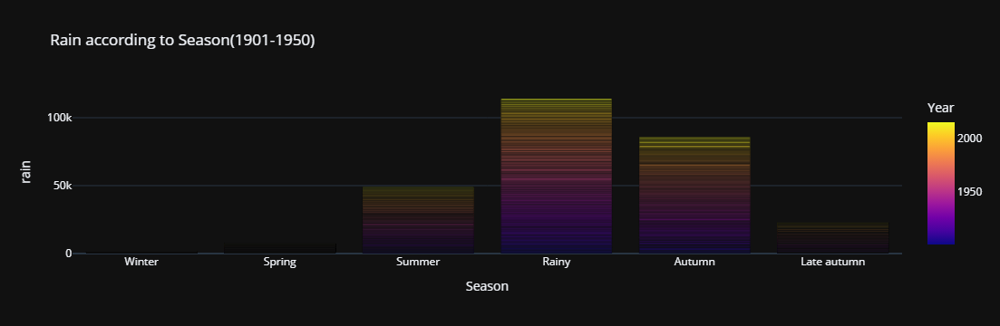

In [22]:
pio.templates.default = "plotly_dark"
fig = px.bar(df_tr,x='Season',y='rain',color="Year",title="Rain according to Season(1901-1950)")
fig.show()

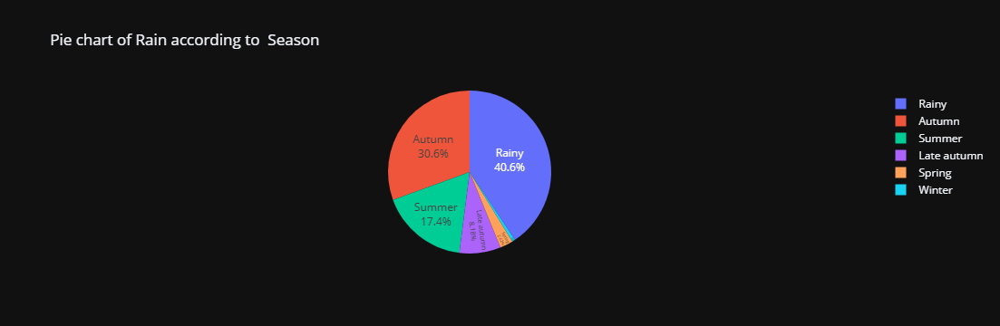

In [23]:
fig = px.pie(data_frame=df_tr,values="rain",names='Season',labels= {"Season"},
             title="Pie chart of Rain according to  Season")
fig.update_traces(textposition ='inside',textinfo='percent+label')
fig.show()

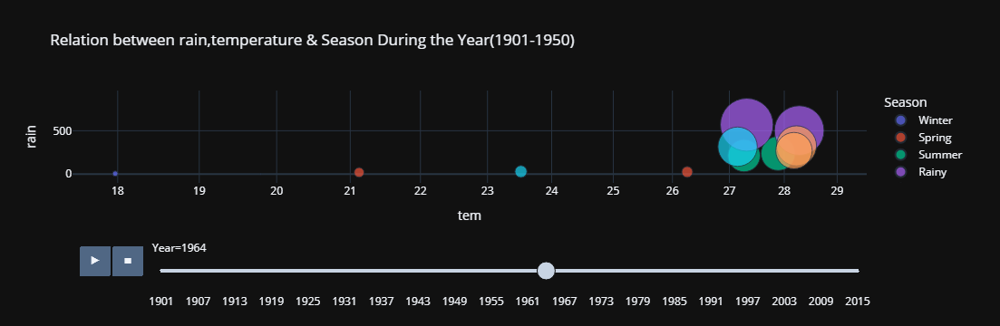

In [24]:
pio.templates.default = "plotly_dark"
fig = px.scatter(df_tr,x='tem',y ='rain',animation_frame ='Year',animation_group = 'Month',
                 title="Relation between rain,temperature & Season During the Year(1901-1950)",size="rain",color="Season",
                 hover_name="Month",log_x = True,size_max = 55)
fig.show()

In [26]:
df1 = df_tr.loc[600:,:]
df1.tail()

,tem,Month,Year,rain,Season
1375,28.0642,8,2015,512.12700,Autumn
1376,28.1230,9,2015,353.86900,Autumn
1377,26.8624,10,2015,81.59940,Late autumn
1378,23.1842,11,2015,4.60815,Late autumn
1379,18.7124,12,2015,5.97798,Winter


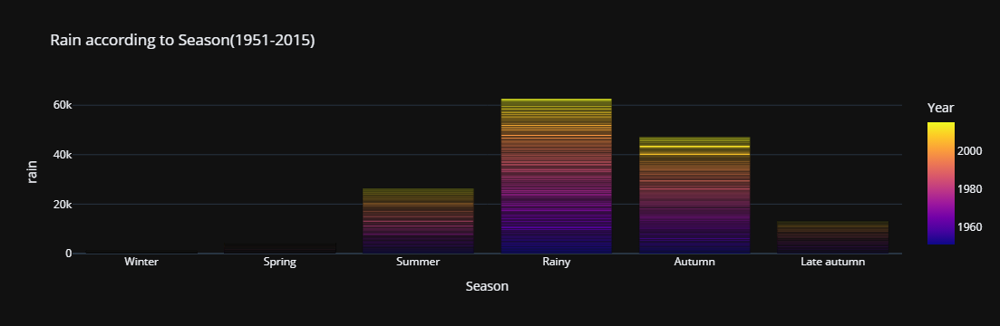

In [27]:
pio.templates.default = "plotly_dark"
fig = px.bar(df1,x='Season',y='rain',color="Year",title="Rain according to Season(1951-2015)")
fig.show()

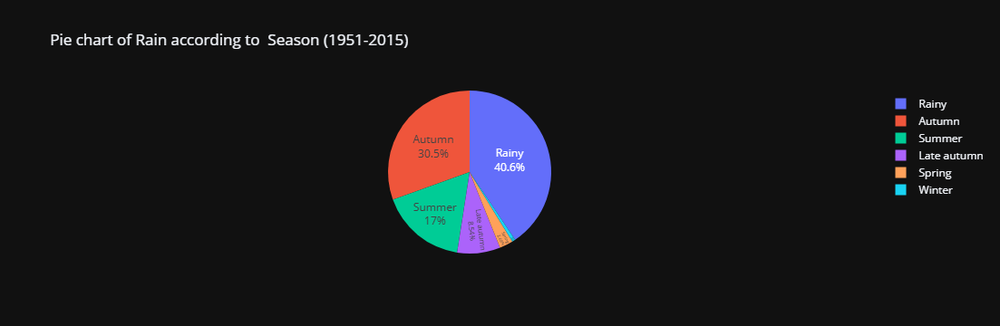

In [28]:
fig = px.pie(data_frame=df1,values="rain",names='Season',labels= {"Season"},
             title="Pie chart of Rain according to  Season (1951-2015)")
fig.update_traces(textposition ='inside',textinfo='percent+label')
fig.show()

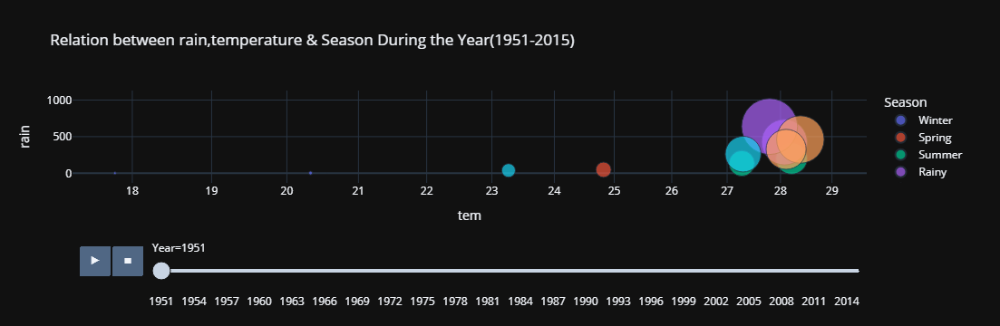

In [29]:
pio.templates.default = "plotly_dark"
fig = px.scatter(df1,x='tem',y ='rain',animation_frame ='Year',animation_group = 'Month',
                 title="Relation between rain,temperature & Season During the Year(1951-2015)",size="rain",color="Season",
                 hover_name="Month",log_x = True,size_max = 55)
fig.show()

In [46]:
#load the data into sql server using replace option


connection_string = (
    "DRIVER={ODBC Driver 17 for SQL Server};"
    "SERVER=CYGNET;"
    "DATABASE=db_finance;"
    "Trusted_Connection=yes;"
)

try:
    connection = pyodbc.connect(connection_string)
    print("Connection successful!")
except pyodbc.Error as e:
    print(f"Error connecting to SQL Server: {e}")


Connection successful!


In [45]:
import pyodbc

drivers = pyodbc.drivers()
print("Available ODBC Drivers:")
for driver in drivers:
    print(driver)

Available ODBC Drivers:
SQL Server
SQL Server Native Client 11.0
ODBC Driver 13 for SQL Server
ODBC Driver 11 for SQL Server
Microsoft Access dBASE Driver (*.dbf, *.ndx, *.mdx)
Oracle in OraDB12Home1
ODBC Driver 17 for SQL Server
Microsoft Access Driver (*.mdb, *.accdb)
Microsoft Excel Driver (*.xls, *.xlsx, *.xlsm, *.xlsb)
Microsoft Access Text Driver (*.txt, *.csv)


In [47]:
#load the data into sql server using replace option
import sqlalchemy as sal
engine = sal.create_engine('mssql://CYGNET/db_finance?driver=ODBC Driver 17 for SQL Server')
conn=engine.connect()

In [48]:
#load the data into sql server using append option
df_tr.to_sql('Temp_and_rain', con=conn , index=False, if_exists = 'append')

70